# Математический маятник

Математический маятник - классический пример гармонического осциллятора.

Пусть он состоит из материальной точки массой $m$, подвешенной на конце невесомой нерастяжимой нити или лёгкого стержня длины $L$, как показано на рис. 

![Pendulum](https://github.com/GandhiKK/Pendulum-2021/raw/master/project/pendulum.png)

Маятник движется только в одной плоскости, и трение отсутствует. Пусть $\theta$ обозначает угол между вертикальной осью и нитью, такой, что $\theta = 0$ означает положение равновесия. Предполагается, что потерь энергии в системе нет.

Воспользуемся вторым законом Ньютона $F = ma$, чтобы найти дифференциальное уравнение, описывающее движение маятника. Пусть $t$ обозначает время. 

Движение маятника описывается уравнением:

$$ L\ddot{\theta}=L\dfrac{d^2\theta}{dt^2}=-g\sin(\theta) $$

In [1]:
import numpy as np
import pandas as pd
from scipy.integrate import odeint
import matplotlib.pyplot as plt
plt.style.use('bmh')
figsize = (12, 5)
dpi = 600

### Аналитическое решение

Уравнение не может быть решено аналитически. Однако в области малых углов $sin(\theta)\approx\theta$ это уравнение может быть аппроксимировано как 
$$ L\ddot{\theta}\approx-g\theta $$
которое имеет решение:
$$\theta=\theta_0\cos(\omega t)$$
где $\theta_0$ - начальная позиция при $t=0$, а $\omega=\sqrt{g/L}$ - собственная частота колебаний

Это называется грамоническими колебаниями. Период колебаний равен $T=2\pi/\omega=2\pi\sqrt{L/g}$

In [2]:
g = 9.81
L = 50
theta0 = np.pi/12
t0 = 0
T0 = 200
X, T = [], []
f_counter = []

In [3]:
def approx(t, theta0):
    return theta0*np.cos(np.sqrt(g/L)*t)

#### График аналитического решения уравнения с шагом $h = 0.001$:

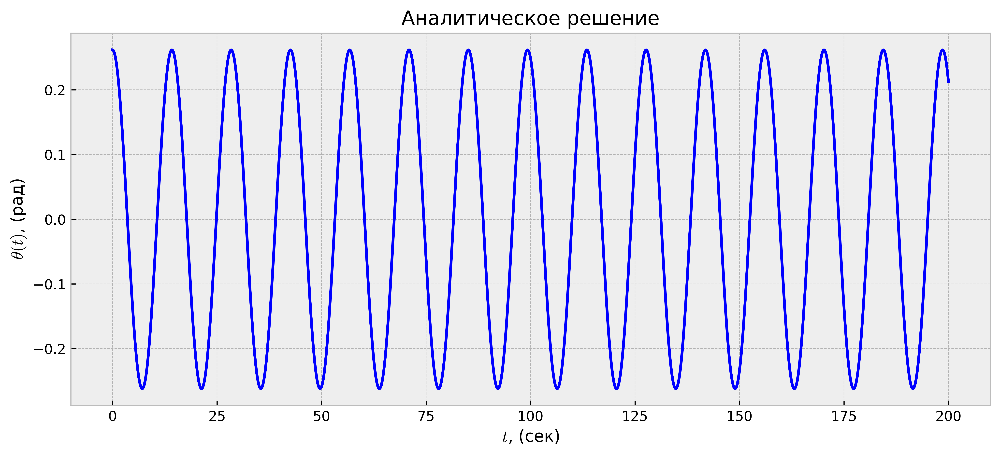

In [4]:
t = np.arange(t0, T0, 0.001)
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Аналитическое решение")
plt.plot(t, approx(t, theta0), "b-")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.show()

### Численное решение

Запишем исходное дифференциальное уравнение в виде двух связанных дифференциальных уравнений первого порядка, введя угловую скорость $\omega=\dot\theta$:
$$d\theta = \omega\,dt$$
$$d\omega = -\dfrac{g}{L}\theta\,dt$$


In [5]:
def f(x):
    theta = x[0]
    w = x[1]
    dtheta = w
    dw = -(g/L)*(theta)
    f_counter.append(1)
    return np.array([dtheta, dw])

## Явные одношаговые методы

### Метод Эйлера (1)

Явный одношаговый метод семейства Рунге-Кутты первого порядка.

Имеет погрешность на шаге $o(h^2)$ и погрешность в целом $o(h)$.

Таблица Бутчера для метода:

<!-- \begin{array}
{c|cccc}
0\\
\frac{1}{2} & \frac{1}{2}\\
\frac{1}{2} &0 &\frac{1}{2} \\
1& 0& 0& 1\\
\hline
& \frac{1}{6} &\frac{1}{3} &\frac{1}{3} &\frac{1}{6} 
\end{array} -->

\begin{array}
{|cc}
1 \\
\hline
0 
\end{array}

In [6]:
def callback(x, t):
    T.append(t)
    X.append(x.copy())

def out(x, t):
    return np.array(x)[:, 0], np.array(x)[:, 1], np.array(t)

In [7]:
def euler_method(f, X0, t0, T0, h, call):
    while t0 < T0-h:
        call(X0, t0)
        k1 = f(X0)
        X = X0 + h*k1    
        t0 += h
        X0 = X

In [8]:
h1 = 0.001
X, T, f_counter = [], [], []
euler_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))

h2 = 0.01
X, T, f_counter = [], [], []
euler_method(f, [theta0, 0], t0, T0, h2, callback)
theta2, w2, t2 = out(X, T)
print(len(f_counter))

199999
20000


#### График аналитического решения уравнения и решения методом Эйлера  с шагом $h_1 = 0.001$ и $h_2 = 0.01$:

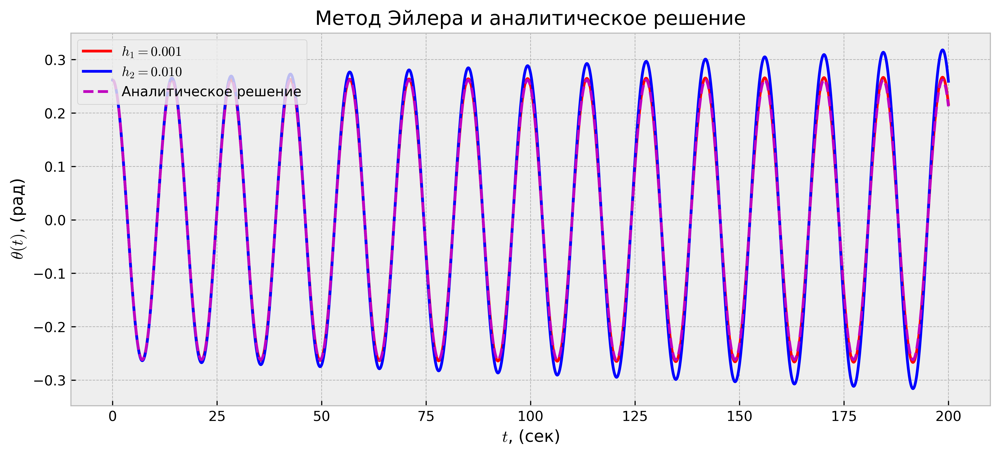

In [9]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Эйлера и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t1, approx(t1, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом Эйлера  с шагом $h = 0.0001$:

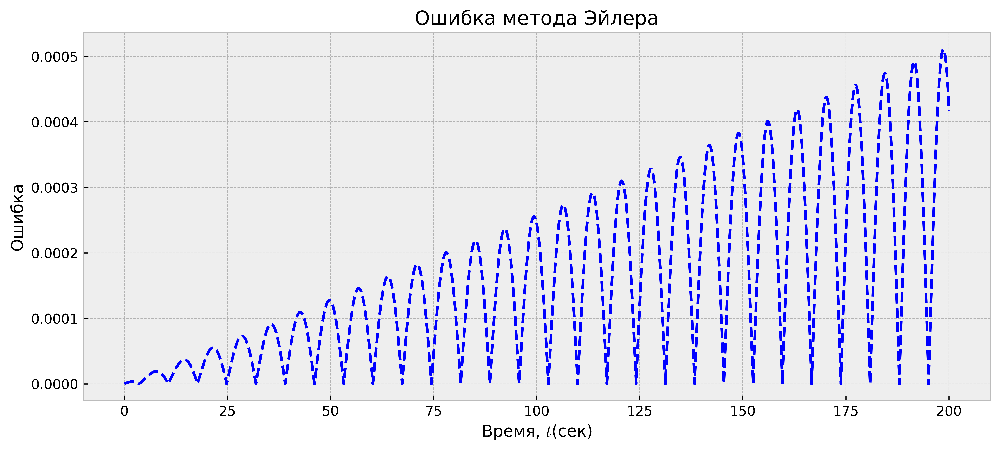

Максимальная ошибка равна  0.0005105607340017415


In [10]:
he = 0.0001
X, T = [], []
euler_method(f, [theta0, 0], t0, T0, he, callback)
thetae, we, te = out(X, T)
error = np.abs(approx(te, theta0) - thetae)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Эйлера") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

### Метод средней точки (2)

Явный одношаговый метод семейства Рунге-Кутты второго порядка. 

Имеет погрешность на шаге $o(h^3)$ и погрешность в целом $o(h^2)$.

Таблица Бутчера для метода:

\begin{array}
{|cc}
0 \\
1/2 & 0 \\
\hline
0 & 1
\end{array}

In [11]:
def midpoint_method(f, X0, t0, T0, h, call):
    while t0 < T0-h:
        call(X0, t0)
        k1 = f(X0)
        k2 = f(X0 + h/2*k1)
        X = X0 + h*k2
        t0 += h
        X0 = X

In [12]:
h1 = 0.01
X, T, f_counter = [], [], []
midpoint_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))
h2 = 0.001
X, T, f_counter = [], [], []
midpoint_method(f, [theta0, 0], t0, T0, h2, callback)
theta2, w2, t2 = out(X, T)
print(len(f_counter))

40000
399998


#### График аналитического решения уравнения и решения методом средней точки с шагом $h_1 = 0.01$ и $h_2 = 0.001$:

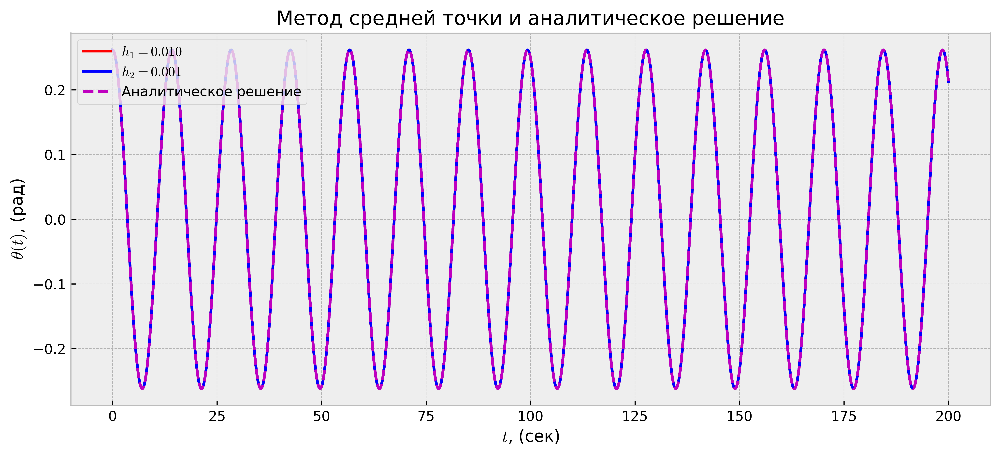

In [13]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод средней точки и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t1, approx(t1, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом средней точки с шагом $h = 0.0001$:

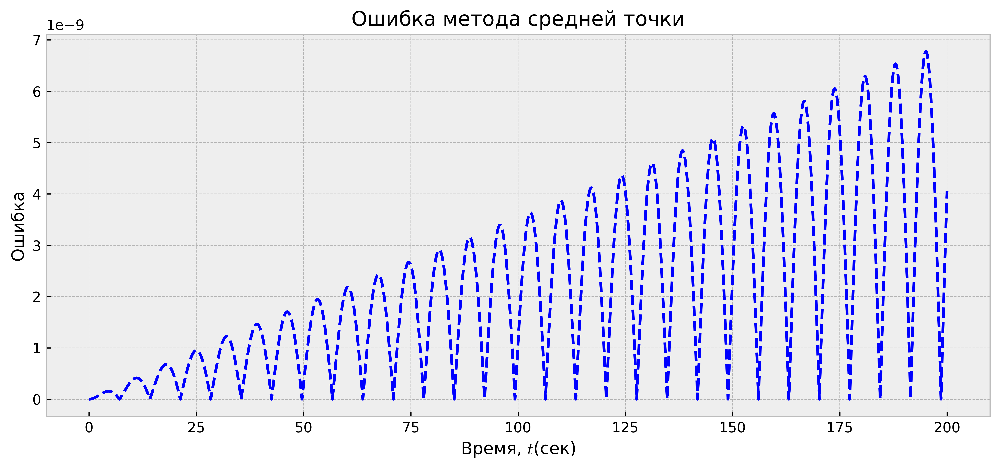

Максимальная ошибка равна  6.775920186052886e-09


In [14]:
he = 0.0001
X, T = [], []
midpoint_method(f, [theta0, 0], t0, T0, he, callback)
thetae, we, te = out(X, T)
error = np.abs(approx(te, theta0) - thetae)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода средней точки") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

### Метод Рунге-Кутты (4)

Явный одношаговый метод семейства Рунге-Кутты четвёртого порядка. 
Имеет погрешность на шаге $o(h^5)$ и погрешность в целом $o(h^4)$.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 1/2 & 0 \\
0 & 0 & 1 & 0 \\
\hline
1/6 & 1/3 & 1/3 & 1/6 
\end{array}

In [15]:
def RK4_method(f, X0, t0, T0, h, call):
    while t0 < T0-h:
        call(X0, t0)
        k1 = f(X0)
        k2 = f(X0 + h/2*k1)
        k3 = f(X0 + h/2*k2)
        k4 =  f(X0 + h*k3)
        X= X0 + h/6*(k1 + 2*k2 + 2*k3 + k4)
        t0 += h
        X0 = X

In [16]:
h1 = 0.01
X, T, f_counter = [], [], []
RK4_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))

80000


#### График аналитического решения уравнения и решения методом Рунге-Кутты 4  с шагом $h = 0.01$:

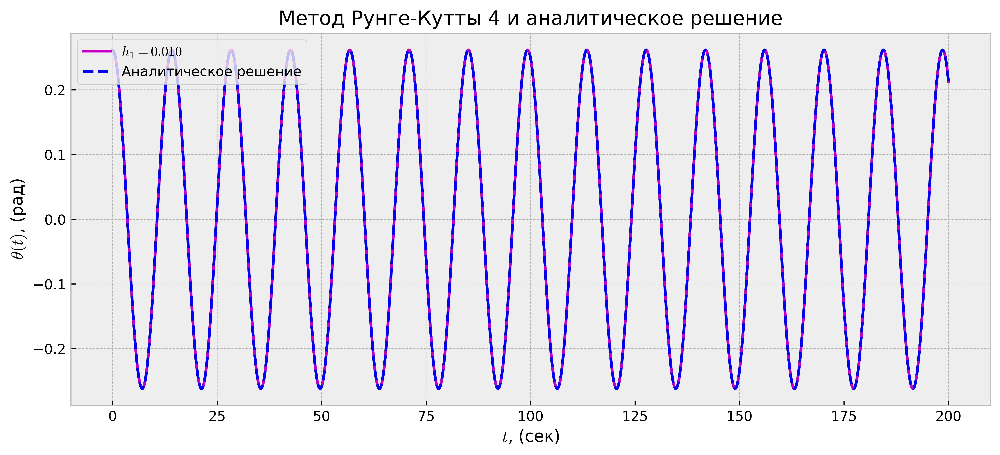

In [17]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Рунге-Кутты 4 и аналитическое решение")
plt.plot(t1, theta1, "m", label=r"$h_1=%.3f$"%(h1))
plt.plot(t1, approx(t1, theta0), "b--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

#### График модуля ошибки аналитического решения уравнения и решения методом Рунге-Кутты 4 с шагом $h = 0.01$:

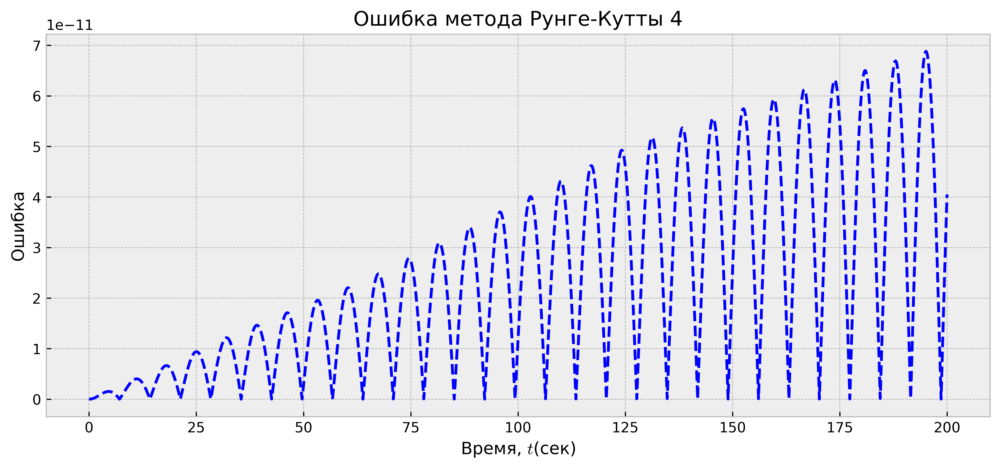

Максимальная ошибка равна  6.879657260538963e-11


In [18]:
he = 0.01
X, T = [], []
RK4_method(f, [theta0, 0], t0, T0, he, callback)
thetae, we, te = out(X, T)
error = np.abs(approx(te, theta0) - thetae)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(te, error, "b--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Рунге-Кутты 4") 
plt.show()
print("Максимальная ошибка равна ", np.max(error))

## Явные одношаговые вложенные методы


### Метод Богацкого-Шампина (3(2))

Метод Богацкого-Шампина - это метод Рунге-Кутты третьего порядка с четырьмя этапами со свойством FSAL, поэтому он использует примерно три вычисления функции на шаг.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 3/4 & 0 \\
2/9 & 1/3 & 4/9 & 0 \\
\hline
2/9 & 1/3 & 4/9 & 0 \\
\hline
7/24 & 1/4 & 1/3 & 1/8 
\end{array}

In [19]:
def true_sol(t, x0, w0):
    return x0 * np.cos(np.sqrt(g/L) * t) + (w0/np.sqrt(g/L)) * np.sin(np.sqrt(g/L) * t)

def error_handler(x, x_hat):
    err = 0
    x = np.array(x)
    x_hat = np.array(x_hat)
    tol = np.zeros(len(x))
    for i in range(len(x)):
        tol[i] = atol + max(abs(x[i]), abs(x_hat[i])) * rtol
        err += ((x_hat[i] - x[i]) / tol[i]) ** 2
    err = np.sqrt(err/(len(x)))
    return err

def BS_method(f, X0, t0, T0, h, call):
    errors, true_errors = [], []
    k1 = f(X0)
    while t0 < T0-h:
        call(X0, t0)
        k2 = f(X0 + h/2*k1)
        k3 = f(X0 + (3*h)/4*k2)
        X_new = X0 + (2*h)/9*k1 + (1*h)/3*k2 + (4*h)/9*k3 
        k4 =  f(X_new)
        X_hat = X0 + h*(7*k1 + 6*k2 + 8*k3 + 3*k4)/24
        err = error_handler(X_new, X_hat)
        h = h * ((1/err)**(1/3))
        t0 += h
        eps = np.abs(X_new[0] - X_hat[0]) # оценка локальной ошибки
        true_eps = np.abs(true_sol(h, X0[0], X0[1]) - X_new[0]) # истинное значение локальной ошибки        
        X0 = X_new
        k1 = k4
        errors.append(eps)
        true_errors.append(true_eps)
    return np.array(errors), np.array(true_errors)

In [43]:
atol, rtol = 2e-10, 2e-10
h1 = 0.01
T0 = 20
X, T, f_counter = [], [], []
e1, te1 = BS_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))

6259


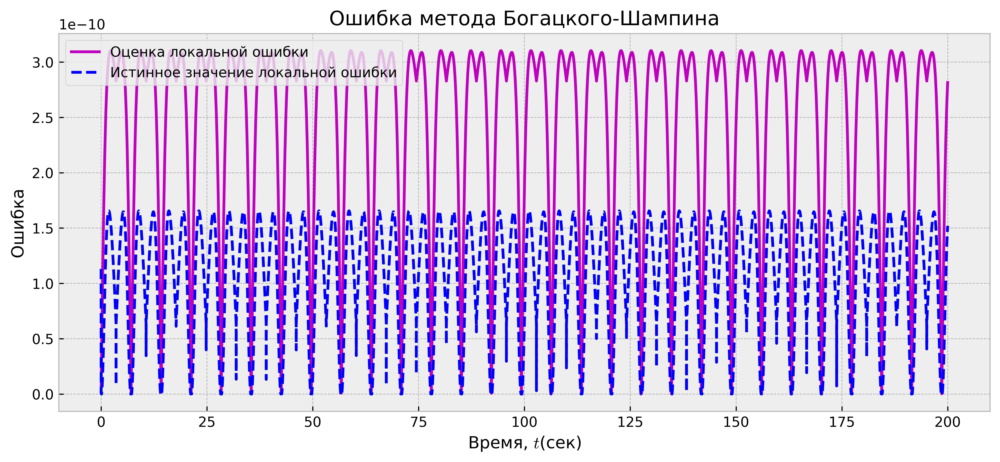

In [21]:
plt.figure(figsize=figsize, dpi=dpi)
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Богацкого-Шампина") 
plt.plot(t1, e1, "m-", label=r'Оценка локальной ошибки')
plt.plot(t1, te1*2e-4, "b--", label=r'Истинное значение локальной ошибки')
plt.legend(loc='upper left')
plt.show()

## Многошаговые методы

### Метод Адамса-Башфорта

$ k = 4 : x_{n+1} = x_n + h(\dfrac{55}{24}f_n-\dfrac{59}{24}f_{n-1}+\dfrac{37}{24}f_{n-2}-\dfrac{3}{8}f_{n-3}) $

Для вычисления начальных значений был использован одношаговый метод Рунге-
Кутты 4 порядка.

In [22]:
def AB_method(f, X0, t0, T0, h, call):
    RK4_method(f, X0, t0, t0+5*h, h, call)
    t0 = t0 + 3*h
    i = 3
    while t0 < T0-h:
        Y = X[i] + h/24. * (55*f(X[i]) - 59*f(X[i-1]) + 37*f(X[i-2]) - 9*f(X[i-3]))      
        t0 = t0 + h
        i += 1
        call(Y, t0)

In [38]:
h1 = 0.01
X, T, f_counter = [], [], []
AB_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))

80004


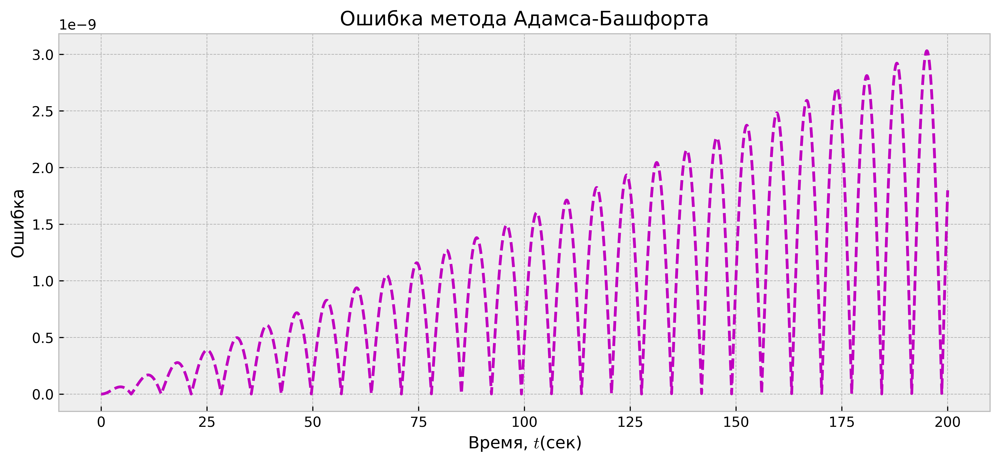

Максимальная ошибка равна  3.0314343917037245e-09


In [39]:
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t1, np.abs(theta1-approx(t1, theta0)), "m--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Адамса-Башфорта") 
plt.show()
print("Максимальная ошибка равна ", np.max(np.abs(theta1-approx(t1, theta0))))

### Метод Адамса-Мултона

$x_{n+1} \leftarrow x_n + h\sum_{i=0}^{k-1}\gamma_i\triangledown^if_n - Predictor (P)$

$f_{n+1} \leftarrow f(x_{n+1}) - Evaluator (PE)$

$x_{n+1} \leftarrow x_n + h\sum_{i=0}^{k}\gamma_i^*\triangledown^if_{n+1} - Corrector (PEC)$

В качестве разгона выступает метод Рунке-Кутты 4 порядка

Схема - PECE



In [25]:
def AM_method(f, X0, t0, T0, h, call):
    RK4_method(f, X0, t0, t0+5*h, h, call)    
    k0, k1, k2, k3 = f(X[3]), f(X[2]), f(X[1]), f(X[0])
    t0 = t0 + 3*h
    i = 3
    while t0 < T0-h:
        k4, k3, k2, k1 = k3, k2, k1, k0 
        # Предиктор (Адамс-Башфорт)
        Y = X[i] + h/24. * (55*k1 - 59*k2 + 37*k3 - 9*k4)
        k0 = f(Y)
        # Корректор (Адамс-Мултон)
        Y = X[i] + h/24. * (9*k0 + 19*k1 - 5*k2 + 1*k3)
        k0 = f(Y)
        t0 += h
        i += 1
        call(Y, t0)

In [26]:
h1 = 0.01
X, T, f_counter = [], [], []
AM_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(len(f_counter))

40014


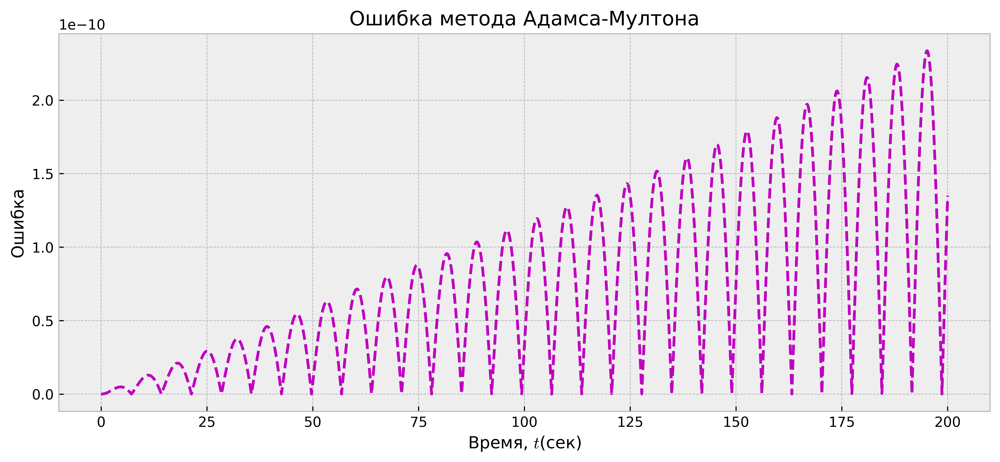

Максимальная ошибка равна  2.336041429740199e-10


In [27]:
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t1, np.abs(theta1-approx(t1, theta0)), "m--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка метода Адамса-Мултона") 
plt.show()
print("Максимальная ошибка равна ", np.max(np.abs(theta1-approx(t1, theta0))))

### Сравнение аналитического решения и scipy.odeint

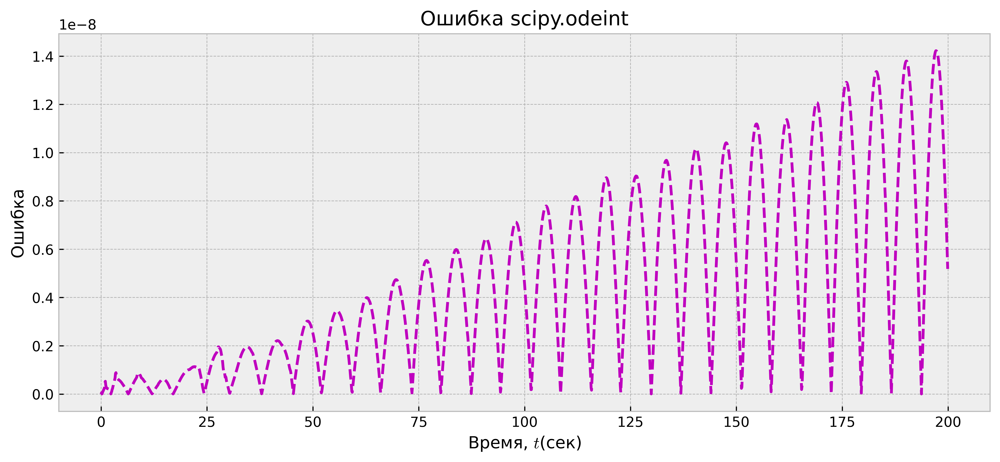

1691
1.4221851585283218e-08


In [42]:
def fsp(X, t):
    f_counter.append(1)
    return np.array([X[1], -(g/L)*(X[0])])
t = np.arange(t0, T0, 0.1)
f_counter = []
tol = 2e-10
Y = odeint(fsp, [theta0, 0], t, atol=tol, rtol=tol)
plt.figure(figsize=figsize, dpi=dpi)
plt.plot(t, np.abs(Y[:, 0] - approx(t, theta0)), "m--")
plt.xlabel("Время, $t$(сек)")
plt.ylabel("Ошибка")
plt.title("Ошибка scipy.odeint") 
plt.show()
print(len(f_counter))
print(np.max(np.abs(Y[:, 0] - approx(t, theta0))))

## Сравнение методов

### Цель: получить решение с заданной точностью как можно реже вызывая f

Решим задачу с точностью 2e-10 и определим сколько вызовов функции f необходимо методам

In [29]:
methods = [midpoint_method, RK4_method, AB_method, AM_method]

T0 = 20
h = 0.1
X, T, f_counter = [], [], []
for method in methods:
    cur_h = h
    print(f'Для метода "{method.__name__}"')
    method(f, [theta0, 0], t0, T0, cur_h, callback)
    theta1, w1, t1 = out(X, T)
    print(f'h = {cur_h} | err = {np.max(np.abs(approx(t1, theta0) - theta1))}')
    while np.max(np.abs(approx(t1, theta0) - theta1)) > 2e-10:
        cur_h *= 0.9
        X, T, f_counter = [], [], []
        method(f, [theta0, 0], t0, T0, cur_h, callback)
        theta1, w1, t1 = out(X, T)
        print(f'h = {cur_h} | err = {np.max(np.abs(approx(t1, theta0) - theta1))} | f_call = {len(f_counter)}')
T0 = 200

Для метода "midpoint_method"
h = 0.1 | err = 0.0006804357369473643
h = 0.09000000000000001 | err = 0.0005509440035903965 | f_call = 444
h = 0.08100000000000002 | err = 0.00044611300689533645 | f_call = 492
h = 0.07290000000000002 | err = 0.00036123165447814187 | f_call = 548
h = 0.06561000000000002 | err = 0.00029251079057154156 | f_call = 608
h = 0.05904900000000002 | err = 0.0002368749295103001 | f_call = 676
h = 0.05314410000000002 | err = 0.00019182116423870077 | f_call = 752
h = 0.04782969000000002 | err = 0.0001553433615086447 | f_call = 836
h = 0.043046721000000024 | err = 0.00012580644989591827 | f_call = 928
h = 0.03874204890000002 | err = 0.00010188448572084202 | f_call = 1032
h = 0.03486784401000002 | err = 8.251382922688788e-05 | f_call = 1146
h = 0.03138105960900001 | err = 6.682719983107377e-05 | f_call = 1274
h = 0.028242953648100012 | err = 5.4122491683711305e-05 | f_call = 1416
h = 0.025418658283290013 | err = 4.383463707092333e-05 | f_call = 1572
h = 0.022876792454961

Метод Эйлера: >1000000

Метод средней точки: 788132

Метод Рунге-Кутты 4: 3496

Метод Богацкого-Шампина: 6259

Метод Адамса-Башфорта: 9028

Мемтод Адамса-Мултона: 2412

### Методы с различными длинами шага

Сравним метод Адамса-Башфорта с шагами $h_1 = 0.01$, $h_2 = 0.001$ и $h_3 = 0.0001$

In [30]:
T0 = 20
h1 = 0.01
X, T, f_counter = [], [], []
AB_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t1, theta0) - theta1)
print(f"Максимальная ошибка равна {np.max(error)}\n")
h1 = 0.001
X, T, f_counter = [], [], []
AB_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t1, theta0) - theta1)
print(f"Максимальная ошибка равна {np.max(error)}\n")
h3 = 0.0001 # численное насыщение
X, T, f_counter = [], [], []
AB_method(f, [theta0, 0], t0, T0, h3, callback)
theta3, w3, t3 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t3, theta0) - theta3)
print(f"Максимальная ошибка равна {np.max(error)}\n")

Вызовы функции f: 8000
Максимальная ошибка равна 2.7792270568260946e-10

Вызовы функции f: 80000
Максимальная ошибка равна 2.699507284376068e-13

Вызовы функции f: 800004
Максимальная ошибка равна 3.303801676679541e-12



Сравним метод Адамса-Мултона с шагами $h_1 = 0.1$ и $h_2 = 0.01$

In [31]:
h1 = 0.1
X, T, f_counter = [], [], []
AM_method(f, [theta0, 0], t0, T0, h1, callback)
theta1, w1, t1 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t1, theta0) - theta1)
print(f"Максимальная ошибка равна {np.max(error)}\n")
h2 = 0.01
X, T, f_counter = [], [], []
AM_method(f, [theta0, 0], t0, T0, h2, callback)
theta2, w2, t2 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t2, theta0) - theta2)
print(f"Максимальная ошибка равна {np.max(error)}\n")
h3 = 0.001
X, T, f_counter = [], [], []
AM_method(f, [theta0, 0], t0, T0, h3, callback)
theta3, w3, t3 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t3, theta0) - theta3)
print(f"Максимальная ошибка равна {np.max(error)}\n")
h4 = 0.0001
X, T, f_counter = [], [], []
AM_method(f, [theta0, 0], t0, T0, h4, callback)
theta4, w4, t4 = out(X, T)
print(f"Вызовы функции f: {len(f_counter)}")
error = np.abs(approx(t4, theta0) - theta4)
print(f"Максимальная ошибка равна {np.max(error)}\n")

Вызовы функции f: 412
Максимальная ошибка равна 2.1655864519687373e-07

Вызовы функции f: 4012
Максимальная ошибка равна 2.108115765286911e-11

Вызовы функции f: 40012
Максимальная ошибка равна 2.898237205783971e-13

Вызовы функции f: 400014
Максимальная ошибка равна 3.3036837154831744e-12



In [ ]:
methods = [AM_method]
T0 = 20
h = 0.1
f_err = 1
X, T, f_counter = [], [], []
for method in methods:
    cur_h = h
    cur_err = f_err
    print(f'Для метода "{method.__name__}"')
    method(f, [theta0, 0], t0, T0, cur_h, callback)
    theta1, w1, t1 = out(X, T)
    print(f'h = {cur_h} | err = {np.max(np.abs(approx(t1, theta0) - theta1))}')
    while np.max(np.abs(approx(t1, theta0) - theta1)) > 2e-10:
        cur_err = np.max(np.abs(approx(t1, theta0) - theta1))
        cur_h *= 0.9
        X, T, f_counter = [], [], []
        method(f, [theta0, 0], t0, T0, cur_h, callback)
        theta1, w1, t1 = out(X, T)
        print(f'h = {cur_h} | err = {np.max(np.abs(approx(t1, theta0) - theta1))} | f_call = {len(f_counter)}')

AB:

h = 0.0007855167211278952 | err = 4.974076706076858e-13 | f_call = 101844

h = 0.0007069650490151057 | err = 1.2229522949880334e-12 | f_call = 113160

AM:

h = 0.0007855167211278952 | err = 4.880262860496032e-13 | f_call = 50934

h = 0.0007069650490151057 | err = 1.2164089180366489e-12 | f_call = 56592